In [1]:
import tensorflow as tf
import numpy as np
import os
from PIL import Image
from matplotlib import pyplot as plt

In [2]:
import pandas as pd

In [3]:
df = pd.read_csv("./annotation_result.csv")

In [4]:
sol_paths, mf_vals = df["customId"], df["male_or_female.value"]

In [28]:
from random import shuffle

In [29]:
data_dir = "./faces"
files = ["{}/{}".format(data_dir, fi) for fi in os.listdir(data_dir) if fi.endswith("jpg")][:2000]
shuffle(files)

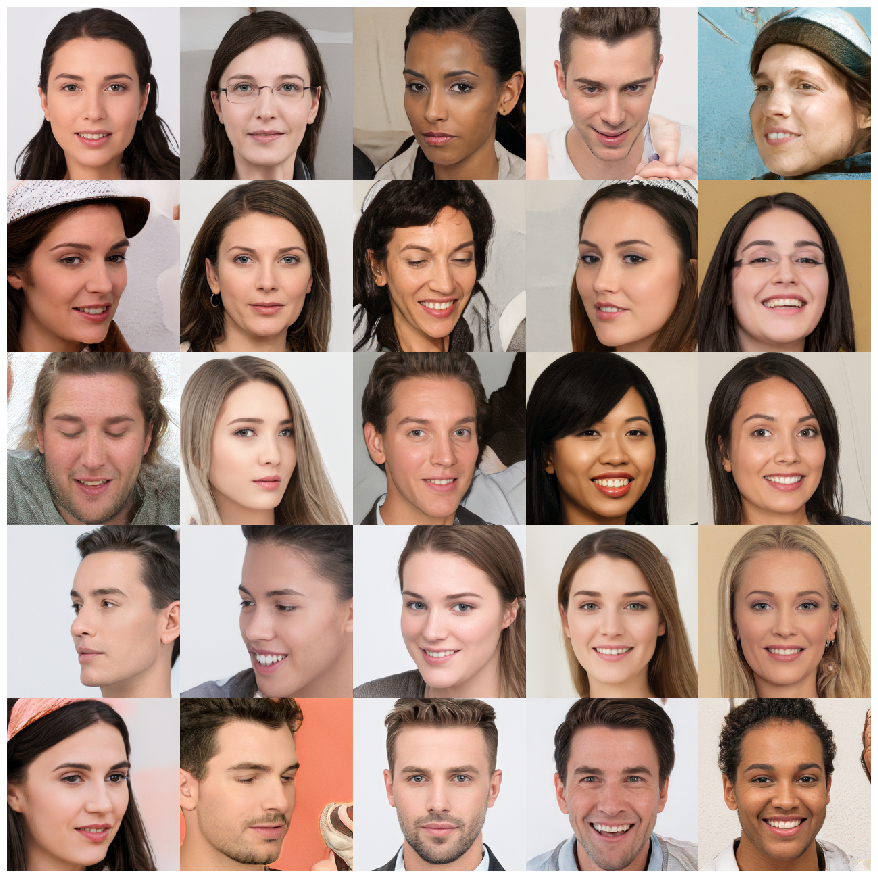

In [31]:
# -------- INSPECT DATA ----------------
def get_image_data(filename):
    img = Image.open(filename)
    img.load()
    data = np.asarray(img, dtype="int32")
    return data

def plot_25(indices, savename=None):
    f, axarr = plt.subplots(5, 5)
    f.set_size_inches(12, 12)
    f.subplots_adjust(wspace=0, hspace=0, left=0, right=1, top=1, bottom=0)
    for i in range(25):
        axarr[i // 5, i % 5].axis("off")
        axarr[i // 5, i % 5].imshow(get_image_data(files[indices[i]]))
    if savename is not None:
        f.savefig(savename)

plot_25(list(range(25)), "./faces5x5.png")

In [32]:
from tqdm import tqdm

In [33]:
# ---------- SAVE DATA AS NUMPY ARRAY -----------
def load_image(filename):
    img = Image.open(filename).convert("L")
    img.load()
    img.thumbnail((64,64), Image.ANTIALIAS)
    data = np.asarray(img, dtype="int32")
    return data


X = np.array(list([load_image(fi) for fi in tqdm(files)]), dtype=np.float32) / 256
print(X.shape)

100%|█████████████████████████████████████████████████████████████████████████████| 1999/1999 [00:06<00:00, 322.21it/s]


(1999, 64, 64)


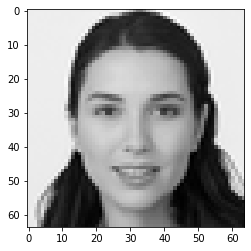

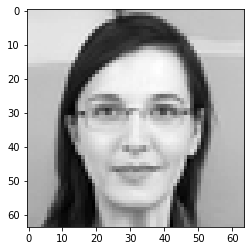

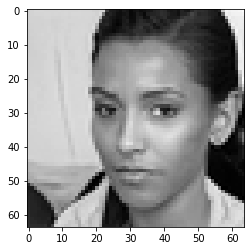

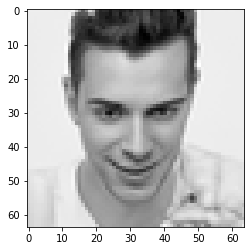

In [34]:
plt.imshow(X[0, :, :], cmap="gray")
plt.show()
plt.imshow(X[1,:, :], cmap="gray")
plt.show()
plt.imshow(X[2, :, :], cmap="gray")
plt.show()
plt.imshow(X[3, :, :], cmap="gray")
plt.show()

In [35]:
print(X.shape)

(1999, 64, 64)


In [36]:
mf_vals[[0,1]].iloc[0]

'male'

In [37]:
Y = np.array([0 if mf_vals[sol_paths==local_fi.split("./")[1]].iloc[0] == 'male' else 1 for local_fi in files])

In [38]:
Y.shape, X.shape

((1999,), (1999, 64, 64))

In [39]:
from tensorflow.keras.utils import to_categorical
to_categorical(Y)[:5,:]

array([[0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 0.],
       [1., 0.]], dtype=float32)

In [40]:
X = np.expand_dims(X, axis=3)
Y = to_categorical(Y)

In [41]:
from tensorflow import keras

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D

num_output_classes = 2
input_img_size = (64, 64, 1)  # 64x64 image with 1 color channel

model = Sequential()
model.add(Conv2D(32, kernel_size=(3, 3), activation="relu", input_shape=input_img_size))
model.add(Conv2D(64, (3, 3), activation="relu"))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(64, activation="relu"))
model.add(Dropout(0.5))
model.add(Dense(num_output_classes, activation="softmax"))
model.compile(
    loss=keras.losses.categorical_crossentropy,
    optimizer=keras.optimizers.Adadelta(),
    metrics=["accuracy"],
)

In [46]:
batch_size = 128
epochs = 100

history  = model.fit(X, Y,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          validation_split=0.2)

# score = model.evaluate(test_X, test_Y, verbose=0)
# print('Test loss:', score[0])
# print('Test accuracy:', score[1])

Train on 1599 samples, validate on 400 samples
Epoch 1/100
1599/1599 [==============================] - ETA: 0s - loss: 0.4584 - accuracy: 0.78 - ETA: 0s - loss: 0.4583 - accuracy: 0.77 - ETA: 0s - loss: 0.4727 - accuracy: 0.77 - ETA: 0s - loss: 0.4674 - accuracy: 0.77 - ETA: 0s - loss: 0.4640 - accuracy: 0.77 - ETA: 0s - loss: 0.4635 - accuracy: 0.77 - 0s 302us/sample - loss: 0.4641 - accuracy: 0.7780 - val_loss: 0.4830 - val_accuracy: 0.7850
Epoch 2/100
1599/1599 [==============================] - ETA: 0s - loss: 0.4862 - accuracy: 0.73 - ETA: 0s - loss: 0.4998 - accuracy: 0.74 - ETA: 0s - loss: 0.4867 - accuracy: 0.75 - ETA: 0s - loss: 0.4753 - accuracy: 0.76 - ETA: 0s - loss: 0.4725 - accuracy: 0.76 - ETA: 0s - loss: 0.4683 - accuracy: 0.77 - 0s 293us/sample - loss: 0.4702 - accuracy: 0.7749 - val_loss: 0.4824 - val_accuracy: 0.7850
Epoch 3/100
1599/1599 [==============================] - ETA: 0s - loss: 0.4796 - accuracy: 0.78 - ETA: 0s - loss: 0.4700 - accuracy: 0.78 - ETA: 0s - 

1599/1599 [==============================] - ETA: 0s - loss: 0.4196 - accuracy: 0.82 - ETA: 0s - loss: 0.4337 - accuracy: 0.79 - ETA: 0s - loss: 0.4405 - accuracy: 0.79 - ETA: 0s - loss: 0.4735 - accuracy: 0.77 - ETA: 0s - loss: 0.4679 - accuracy: 0.77 - ETA: 0s - loss: 0.4555 - accuracy: 0.78 - 0s 293us/sample - loss: 0.4592 - accuracy: 0.7799 - val_loss: 0.4774 - val_accuracy: 0.7825
Epoch 22/100
1599/1599 [==============================] - ETA: 0s - loss: 0.4432 - accuracy: 0.80 - ETA: 0s - loss: 0.4988 - accuracy: 0.75 - ETA: 0s - loss: 0.4691 - accuracy: 0.78 - ETA: 0s - loss: 0.4634 - accuracy: 0.78 - ETA: 0s - loss: 0.4582 - accuracy: 0.78 - ETA: 0s - loss: 0.4626 - accuracy: 0.78 - 0s 299us/sample - loss: 0.4692 - accuracy: 0.7817 - val_loss: 0.4760 - val_accuracy: 0.7875
Epoch 23/100
1599/1599 [==============================] - ETA: 0s - loss: 0.4502 - accuracy: 0.77 - ETA: 0s - loss: 0.4741 - accuracy: 0.77 - ETA: 0s - loss: 0.4762 - accuracy: 0.77 - ETA: 0s - loss: 0.4789 - 

1599/1599 [==============================] - ETA: 0s - loss: 0.4254 - accuracy: 0.81 - ETA: 0s - loss: 0.4328 - accuracy: 0.79 - ETA: 0s - loss: 0.4540 - accuracy: 0.78 - ETA: 0s - loss: 0.4457 - accuracy: 0.79 - ETA: 0s - loss: 0.4402 - accuracy: 0.79 - ETA: 0s - loss: 0.4525 - accuracy: 0.79 - 0s 301us/sample - loss: 0.4493 - accuracy: 0.7930 - val_loss: 0.4711 - val_accuracy: 0.7875
Epoch 42/100
1599/1599 [==============================] - ETA: 0s - loss: 0.4207 - accuracy: 0.81 - ETA: 0s - loss: 0.4476 - accuracy: 0.78 - ETA: 0s - loss: 0.4378 - accuracy: 0.80 - ETA: 0s - loss: 0.4416 - accuracy: 0.80 - ETA: 0s - loss: 0.4454 - accuracy: 0.80 - ETA: 0s - loss: 0.4512 - accuracy: 0.79 - 0s 295us/sample - loss: 0.4531 - accuracy: 0.7961 - val_loss: 0.4702 - val_accuracy: 0.7850
Epoch 43/100
1599/1599 [==============================] - ETA: 0s - loss: 0.4066 - accuracy: 0.82 - ETA: 0s - loss: 0.4373 - accuracy: 0.79 - ETA: 0s - loss: 0.4390 - accuracy: 0.79 - ETA: 0s - loss: 0.4491 - 

1599/1599 [==============================] - ETA: 0s - loss: 0.4908 - accuracy: 0.75 - ETA: 0s - loss: 0.4787 - accuracy: 0.75 - ETA: 0s - loss: 0.4625 - accuracy: 0.78 - ETA: 0s - loss: 0.4642 - accuracy: 0.78 - ETA: 0s - loss: 0.4587 - accuracy: 0.78 - ETA: 0s - loss: 0.4529 - accuracy: 0.78 - 0s 291us/sample - loss: 0.4476 - accuracy: 0.7905 - val_loss: 0.4663 - val_accuracy: 0.7900
Epoch 62/100
1599/1599 [==============================] - ETA: 0s - loss: 0.4276 - accuracy: 0.80 - ETA: 0s - loss: 0.4797 - accuracy: 0.76 - ETA: 0s - loss: 0.4612 - accuracy: 0.78 - ETA: 0s - loss: 0.4683 - accuracy: 0.77 - ETA: 0s - loss: 0.4587 - accuracy: 0.78 - ETA: 0s - loss: 0.4534 - accuracy: 0.79 - 0s 290us/sample - loss: 0.4495 - accuracy: 0.7955 - val_loss: 0.4676 - val_accuracy: 0.7850
Epoch 63/100
1599/1599 [==============================] - ETA: 0s - loss: 0.4661 - accuracy: 0.75 - ETA: 0s - loss: 0.4625 - accuracy: 0.77 - ETA: 0s - loss: 0.4686 - accuracy: 0.78 - ETA: 0s - loss: 0.4541 - 

1599/1599 [==============================] - ETA: 0s - loss: 0.3937 - accuracy: 0.84 - ETA: 0s - loss: 0.4394 - accuracy: 0.79 - ETA: 0s - loss: 0.4336 - accuracy: 0.80 - ETA: 0s - loss: 0.4473 - accuracy: 0.79 - ETA: 0s - loss: 0.4492 - accuracy: 0.79 - ETA: 0s - loss: 0.4447 - accuracy: 0.79 - 0s 297us/sample - loss: 0.4457 - accuracy: 0.7911 - val_loss: 0.4640 - val_accuracy: 0.7875
Epoch 82/100
1599/1599 [==============================] - ETA: 0s - loss: 0.4143 - accuracy: 0.78 - ETA: 0s - loss: 0.4290 - accuracy: 0.79 - ETA: 0s - loss: 0.4463 - accuracy: 0.79 - ETA: 0s - loss: 0.4450 - accuracy: 0.79 - ETA: 0s - loss: 0.4487 - accuracy: 0.78 - ETA: 0s - loss: 0.4421 - accuracy: 0.79 - 0s 293us/sample - loss: 0.4415 - accuracy: 0.7942 - val_loss: 0.4639 - val_accuracy: 0.7900
Epoch 83/100
1599/1599 [==============================] - ETA: 0s - loss: 0.4592 - accuracy: 0.76 - ETA: 0s - loss: 0.4240 - accuracy: 0.81 - ETA: 0s - loss: 0.4528 - accuracy: 0.78 - ETA: 0s - loss: 0.4548 - 

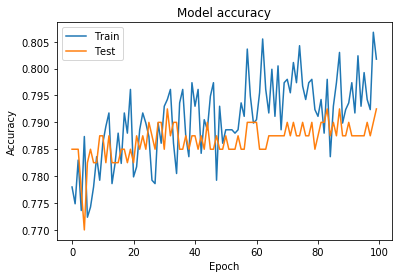

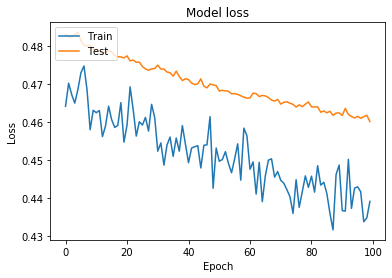

In [47]:
# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [50]:
model.evaluate(X[-300:],Y[-300:])

300/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

 - 0s 160us/sample - loss: 0.5651 - accuracy: 0.7767


[0.4787887406349182, 0.77666664]

In [51]:
Y_pred = model.predict(X)

yd = Y_pred[:, 1] - Y_pred[:, 0]

most_male = np.argsort(yd)
most_female = np.argsort(yd)[::-1]
most_ambiguous = np.argsort(np.abs(yd))

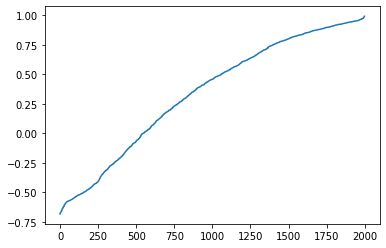

In [52]:
plt.plot(np.sort(yd))

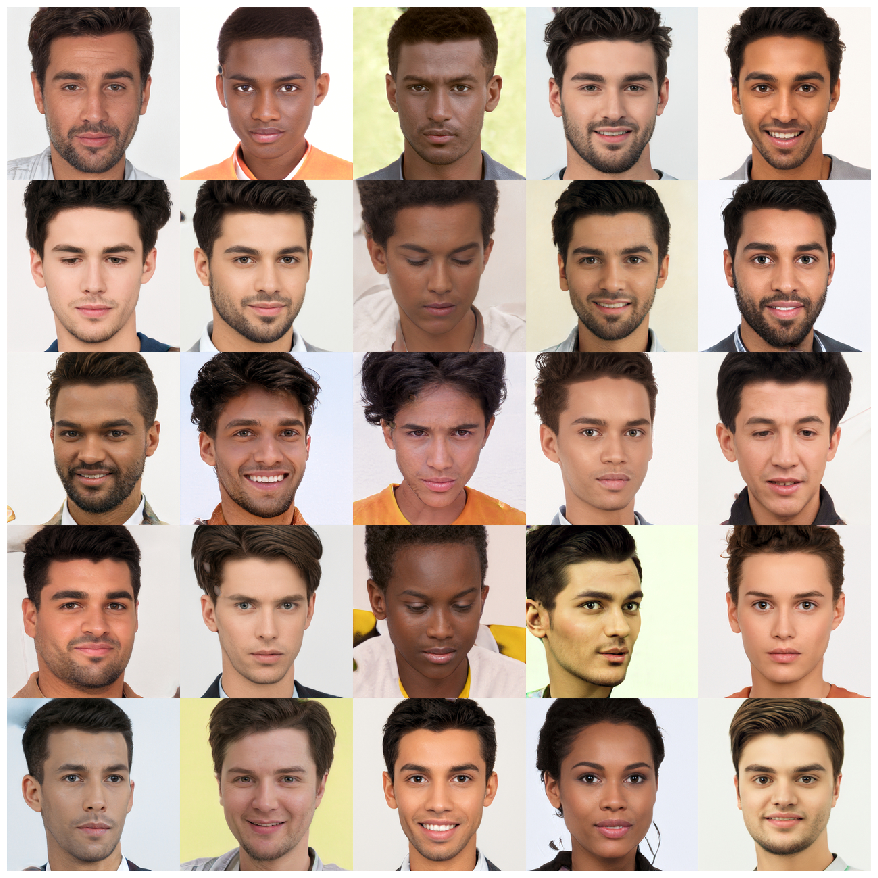

In [53]:
plot_25(most_male[:25], "./most_male.jpg")

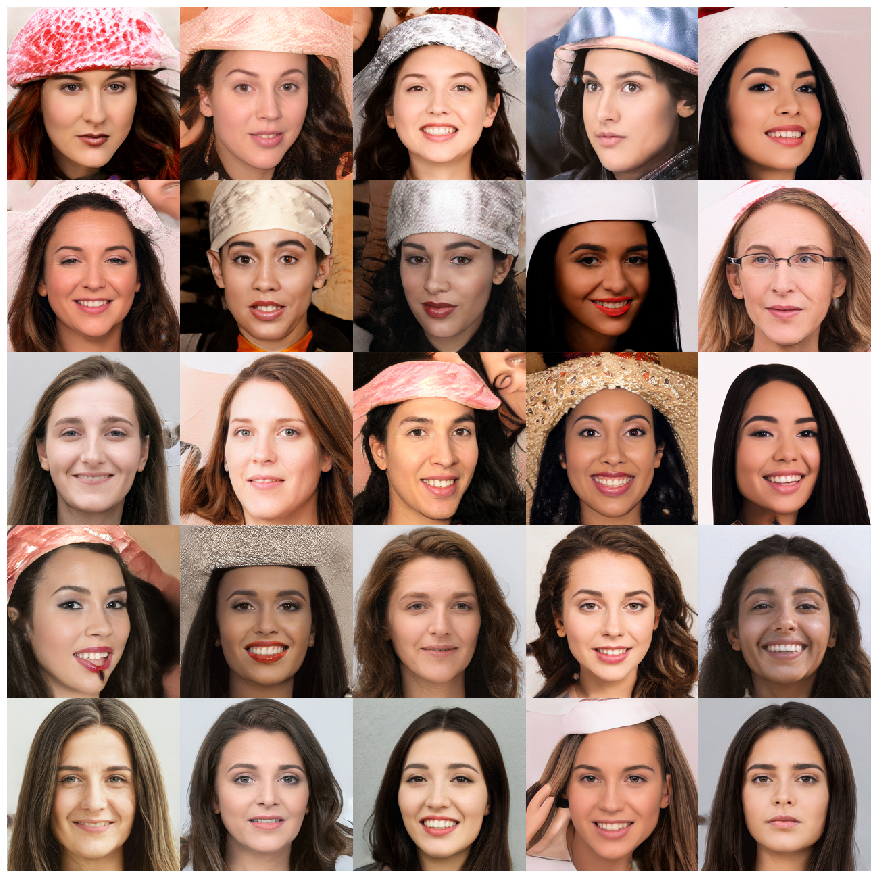

In [54]:
plot_25(most_female[:25], "./most_female.jpg")

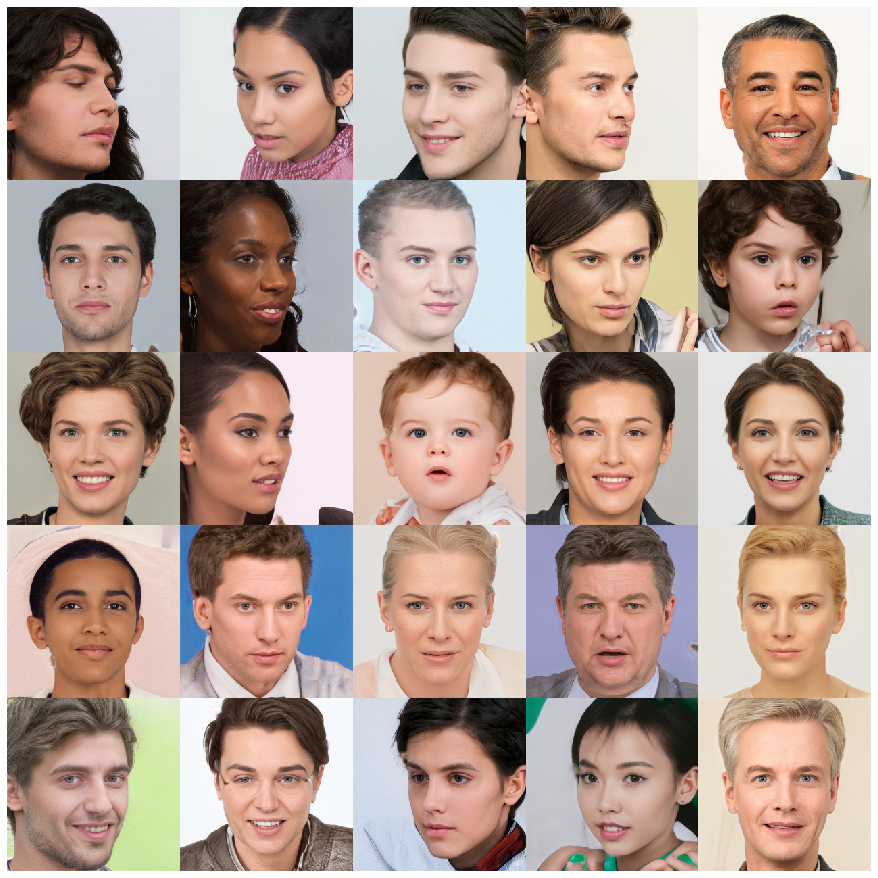

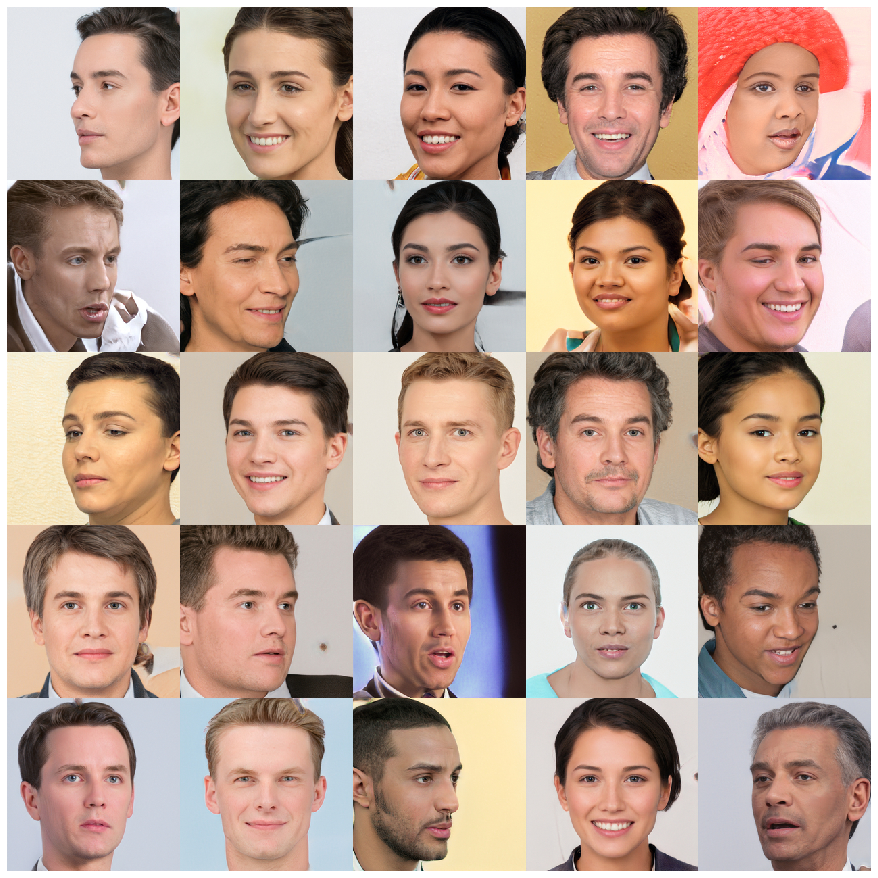

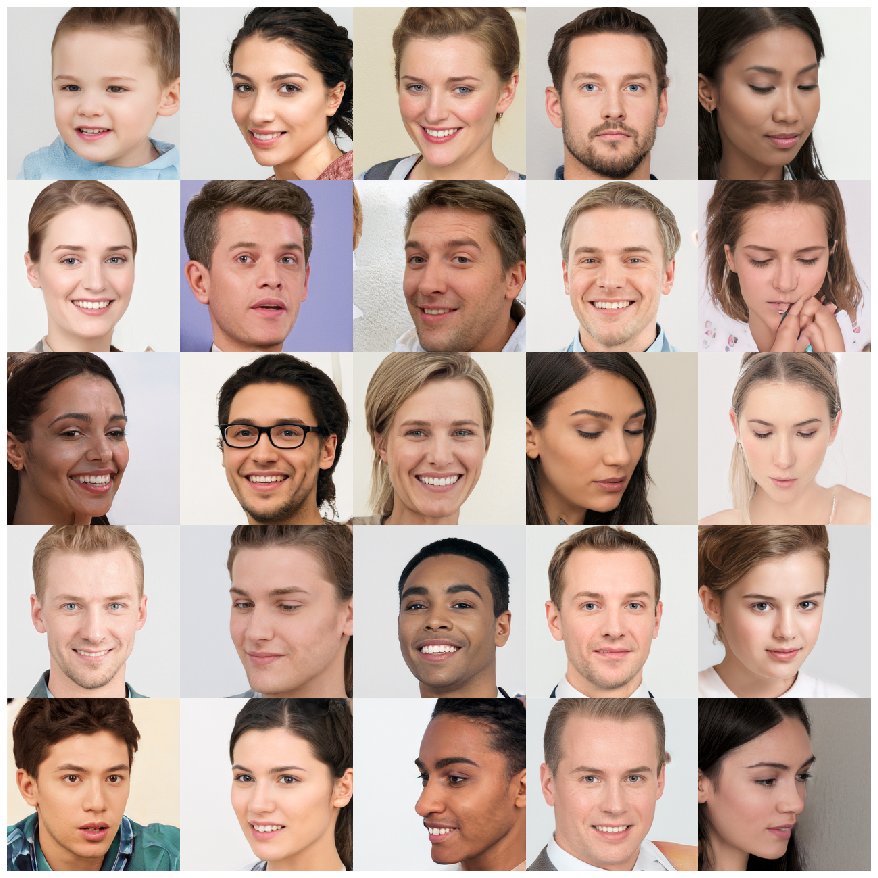

In [55]:
plot_25(most_ambiguous[:25], "./most_ambiguous_1.jpg")
plot_25(most_ambiguous[25:50], "./most_ambiguous_2.jpg")
plot_25(most_ambiguous[50:75], "./most_ambiguous_3.jpg")